In [1]:
import matplotlib.pyplot as plt
import numpy as np
import math
def fa(**kwargs):
    fig,ax = plt.subplots(1,1,**kwargs)
    return fig,ax
%matplotlib notebook
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras import datasets, layers, models, optimizers

/Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/pandas/compat/__init__.py:120: UserWarning: Could not import the lzma module. Your installed Python is incomplete. Attempting to use lzma compression will result in a RuntimeError.
  warnings.warn(msg)


# Linear Regression

In [83]:
import sys
numpy.set_printoptions(threshold=sys.maxsize)
a = np.random.randint(-10000,10000,10000)
x_str = np.array_repr(a).replace('\n', '')
print(x_str)


array([ -4311,  -8852,  -2816,  -7605,  -9209,   3317,   3970,   6334,        -7462,   8266,   7215,   2714,   6710,   4817,   6197,   8556,         6847,  -2000,  -7289,  -6964,  -1833,  -1348,  -5251,    411,         5646,    727,  -5656,   3451,   2396,   1489,   -364,    773,        -5565,   1298,  -4765,  -3857,  -3391,  -2536,   7010,   3264,        -1673,  -6418,  -4134,   2879,   8324,  -7865,   7428,  -5531,         7460,   2461,   5577,   3687,  -1071,   1684,  -6219,  -5959,         8226,  -3612,  -9100,   2923,  -9857,   6585,   5196,   5111,         -921,  -5315,   2165,   7393,   7386,  -8974,   9475,  -5449,          461,   3841,  -7628,   7311,  -7639,  -7291,  -1783,   -677,        -3704,   -357,   4305,  -3969,   8803,  -8022,   2980,   4279,         3170,   4738,   7794,   1164,   4527,  -5803,    233,  -8043,         1677,    253,  -9033,  -7863,   2002,  -2371,   -435,   3081,        -4297,   3109,  -5614,   5501,  -5310,   9384,  -5669,   8238,         9376,   626

In [38]:
sum([True,True])

2

In [69]:
import random
MAX_LENGTH = 1000000
def solution(A):
    # write your code in Python 3.6
    if len(A) == 1:
        return A[0]
    else:
        A = sorted(A)
        last = A[-1]
        print(A)
        for i in range(0,len(A)-1,2):
            print((i,i+1,A[i+1],A[i]))
            if (A[i+1]-A[i]) != 0:
                print(last)
                last = A[i]
                break
        return last
            
            
def gen_array(L, odd):
    """generate a list of sample data: random integers in pairs
    :param L: the length of the list is double this int
    :param odd: the odd integer out
    """
    arr = []
    for _ in range(int(((L)-1)/2)):
        val = random.randint(1, MAX_LENGTH)
        arr.extend((val, val))
    arr.append(odd)
    random.shuffle(arr)
    return arr

arr = gen_array(21, 1230)
solution(arr)

[1230, 27455, 27455, 76642, 76642, 357944, 357944, 373826, 373826, 540014, 540014, 594158, 594158, 801399, 801399, 828332, 828332, 884995, 884995, 919303, 919303]
(0, 1, 27455, 1230)
919303


1230

<IPython.core.display.Javascript object>


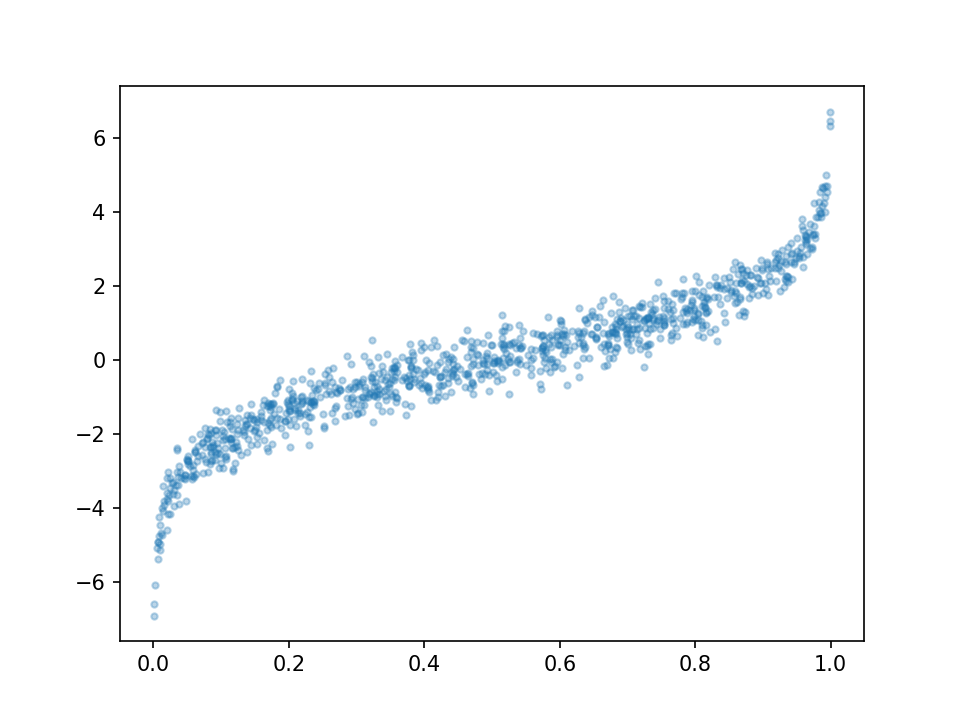

In [27]:
def data_fun(N=1000,noise=.4):
    def logit_transform(p):
        return np.log(p/(1-p))
    x = np.random.rand(N)
    y = logit_transform(x) + np.random.randn(N)*noise
    return {'x':x,'y':y}
data = data_fun()
f,a= fa()
a.scatter(data['x'],data['y'],alpha=0.3,marker='.')

In [37]:
def solution(A, B, K):
    """
    :param A: start integer
    :param B: end integer
    :param K: divisor integer
    :return: count of integers A..B divisible by K
    """
    # just depends whether A is part of the count itself, or not
    if A % K == 0:
        return B//K - A//K + 1
    else:
        return B//K - A//K
solution(10,15,3)

assert solution(1,6,2) == 3

In [ ]:
model = tf.keras.models.Sequential([
                    tf.keras.layers.InputLayer(input_shape=(2,)),
                    tf.keras.layers.Dense(10, activation=tf.nn.softmax),
                    tf.keras.layers.Dense(3, activation=tf.nn.softmax)
                                    ])


# Classification Example

In this example, I will train different classifiers and investigate their decision boundaries.

(3000, 2)
(3000,)


<IPython.core.display.Javascript object>


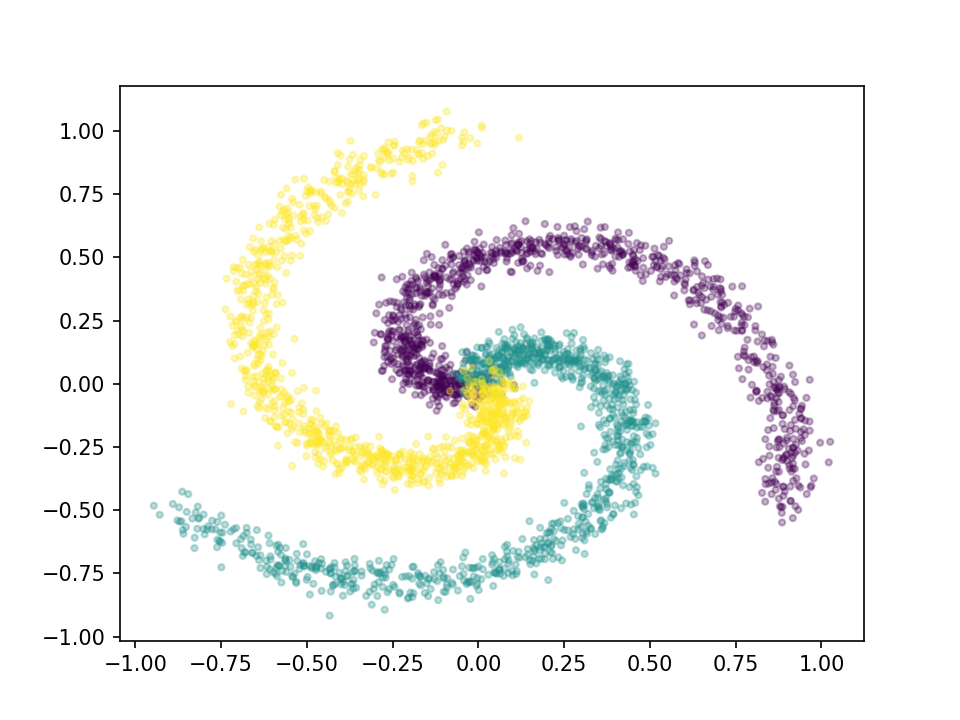

In [2]:
def data_fun(N=1000,noise=.04):
    T_C = 3 #number of categories
    Y = np.tile(np.arange(T_C),(N,1)).ravel(order='F')
    t = np.random.rand(N*T_C)
    X = np.c_[t*(np.sin( (2*np.pi/T_C)*(2*t+Y-1))),t*(np.cos( (2*np.pi/T_C)*(2*t+Y-1) ))]
    X = X + np.random.randn(N*T_C,2)*noise
    return {'X':X,'y':Y}
data = data_fun()
print(data['X'].shape)
print(data['y'].shape)
f,a= fa()
a.scatter(data['X'][:,0],data['X'][:,1],c=data['y'],alpha=0.3,marker='.')

## Linear classifier

In [3]:
X_train, X_test, y_train, y_test = train_test_split(data['X'],data['y'], 
                                                    test_size=0.33, 
                                                    random_state=42)
print(X_train.shape)
print(y_train.shape)
print(np.unique(y_train))

(2010, 2)
(2010,)
[0 1 2]


In [5]:
tf.keras.layers.InputLayer?

In [13]:
model = tf.keras.models.Sequential([
                    tf.keras.layers.InputLayer(input_shape=(2,)),
                    tf.keras.layers.Dense(10, activation=tf.nn.softmax),
                    tf.keras.layers.Dense(3, activation=tf.nn.softmax)
                                    ])
optimizer = tf.keras.optimizers.SGD()
model.compile(loss='categorical_crossentropy',optimizer=optimizer)
model.fit(X_train,y_train)

ValueError: in user code:

    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:806 train_function  *
        return step_function(self, iterator)
    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:796 step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/distribute/distribute_lib.py:1211 run
        return self._extended.call_for_each_replica(fn, args=args, kwargs=kwargs)
    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/distribute/distribute_lib.py:2585 call_for_each_replica
        return self._call_for_each_replica(fn, args, kwargs)
    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/distribute/distribute_lib.py:2945 _call_for_each_replica
        return fn(*args, **kwargs)
    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:789 run_step  **
        outputs = model.train_step(data)
    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:749 train_step
        y, y_pred, sample_weight, regularization_losses=self.losses)
    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/keras/engine/compile_utils.py:204 __call__
        loss_value = loss_obj(y_t, y_p, sample_weight=sw)
    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/keras/losses.py:149 __call__
        losses = ag_call(y_true, y_pred)
    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/keras/losses.py:253 call  **
        return ag_fn(y_true, y_pred, **self._fn_kwargs)
    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/util/dispatch.py:201 wrapper
        return target(*args, **kwargs)
    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/keras/losses.py:1535 categorical_crossentropy
        return K.categorical_crossentropy(y_true, y_pred, from_logits=from_logits)
    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/util/dispatch.py:201 wrapper
        return target(*args, **kwargs)
    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/keras/backend.py:4687 categorical_crossentropy
        target.shape.assert_is_compatible_with(output.shape)
    /Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/tensorflow/python/framework/tensor_shape.py:1134 assert_is_compatible_with
        raise ValueError("Shapes %s and %s are incompatible" % (self, other))

    ValueError: Shapes (None, 1) and (None, 3) are incompatible


In [18]:

def two_hidden_layer(data, labels,activation,N_HIDDEN=1):
    INPUT_SHAPE = (data.shape[1],)
    NB_CLASSES     = np.unique(labels).shape[0]
    print(f"Building Network with 2 hidden layers alike")
    print(f"Found {NB_CLASSES} classes")
    print(f"Found {INPUT_SHAPE} input size")
    model = models.Sequential()
    
    model.add(keras.layers.Dense(N_HIDDEN,input_shape=INPUT_SHAPE,name='dense_layer', activation='relu'))
    model.add(keras.layers.Dense(N_HIDDEN,name='dense_layer_2', activation='relu'))
    model.add(keras.layers.Dense(NB_CLASSES,name='linear', activation=activation))    
    return model

def logistic(data, labels,activation):
    INPUT_SHAPE    = (data.shape[1],)
    NB_CLASSES     = np.unique(labels).shape[0]
    print(f"Building model Logistic Network alike")
    print(f"Found {NB_CLASSES} classes")
    print(f"Found {INPUT_SHAPE} input size")
    model = models.Sequential()
    
    model.add(keras.layers.Dense(NB_CLASSES,
                                 input_shape=INPUT_SHAPE,
                                 name='dense_layer', 
                                 activation=activation))
    
    return model


ValueError: Found input variables with inconsistent numbers of samples: [2, 3000]

# Linear Transformation

A linear transformation takes as input a vector and produces another vector. If you apply this to all the vectors in a space parallel lines stay parallel after the transformation.

In [ ]:
#let's see what happens to parallel lines before and after a transformation
def grid_points():
    start = list()
    B = 3 # boundary
    step = .01
    for y in np.arange(-B,B+1,step=1):
        for x in np.arange(-B,B,step=step):
            start.append([x,y])
    for x in np.arange(-B,B+1,step=1):
        for y in np.arange(-B,B,step=step):
            start.append([x,y])
    start = np.array(start)
    return np.array(start)
def grid_to_color(grid):
    B = np.max(start)
    C = np.c_[(B+start[:,0])/(B*2),np.zeros(start.shape[0]),(B+start[:,1])/(B*2)]
    return C

def plot_grid(points,boundary=3,color=False,ax=ax):
    if color:
        color  = grid_to_color(points)
        alpha = 1
    else:
        color = 'k'
        alpha = .4
    ax.scatter(points[:,0],points[:,1],s=.5,c=color,marker='.',alpha=alpha)
    ax.axis('equal')
#     ax.axis([-boundary,boundary,-boundary,boundary])
    ax.set_xticks([0])
    ax.set_yticks([0])
    ax.grid(True)

In [ ]:
start = grid_points()
W = np.array([[1,.4],[0,.4]])
print(W)
stop = W @ start.T
stop = stop.T
# print(W @ [0,1])
fig, ax = plt.subplots(1,1)
plot_grid(start,color=False,ax=ax)
plot_grid(stop,color=True,ax=ax)
# ax.quiver(start[:,0],start[:,1], stop[:,0], stop[:,1], color=['k'])

In [ ]:
#an example of non-linear transformation
def f(v):
    return np.c_[v[:,0] + np.sin(v[:,0]),v[:,1] + np.sin(v[:,0])]

stop = f(start)
fig, ax = plt.subplots(1,1)
plot_grid(start,color=False,ax=ax)
plot_grid(stop,color=True,ax=ax)
print(f(np.array([[1,1]])))

# Non-linear Least Squares

https://www.youtube.com/watch?v=RyhOBY5qUQI
https://www.youtube.com/watch?v=lsKIhNkzpbw

This is the function we would like to fit, it has two parameters, a and b.
$$ f(x) = ax\sin(bx) $$

Error is defined as follows:

$$ E(a,b) = \sum_{k=0}^{m}(f(x_k) - y_k)^2 $$

Let's plug our function in it:

$$ E(a,b) = \sum_{k=0}^{m}( ax_k\sin(bx_k) - y_k)^2 $$

We need to find the minimum of this function. At minimum two partial derivatives of $E(a,b)$ wrt $a$ and $b$ are both zeros.

$$ \frac{dE}{da} = 0, \frac{dE}{db} = 0 $$

$$ F(a,b) = \frac{dE}{da} = \sum_{k=0}^{m}2(ax_k\sin(bx_k)-y_k)x_ksin(bx_k) = 0$$

This is because of the chain rule $g(f(x))$ where $g(x) = x^2$. Applying the chain rule to $g(f(x))'$ results in $g'(f(x))f'(x)$.

$$ G(a,b) = \frac{dE}{db} = \sum_{k=0}^{m}2(ax_k\sin(bx_k)-y_k)cos(bx_k)x_k = 0$$

We got as many equations as the number of variables. This is a system of two non-linear equations with both two parameters, $F(a,b) = 0$ and $G(a,b) = 0$. This is not a linear system. You can solve this with the Newton's method to the system.

Because these are non-linear, there is no existence or uniqueness of solutions. Especially, here are we are dealing with sines, there will be probably multiple solutions.

## Newtons' Method

Choose an initial guess: $z^0 = [a^0,b^0]$. The Newton iteration is 

$$ X_{k+1} = X_{k} - \frac{f(X_k)}{f'(X_k)} $$

This iteration will bring the value of X to a special point in the error landscape. But right now $X$ is a vector-valued variable, and we have two functions $F(a,b)$ and $G(a,b)$ both with two variables; therefore we need to introduce Jacobian Matrix. Also this returns only the critical points, which are either minimum, maximum or saddle points.

## Jacobian Matrix

$$ J(a,b) =  \begin{bmatrix}
\frac{\delta F}{\delta a} & \frac{\delta F}{\delta b}\\
\frac{\delta G}{\delta a} & \frac{\delta G}{\delta b}
\end{bmatrix}
$$

The J matrix depends on the input variable. So it is not a conventional matrix with fixed values, the values are changing with its arguments, which is a vector.

Planting this in the Newton's iteration above we have to consider that J is a matrix.

$$ X_{k+1} = X_{k} - J^{-1}(X_k) \begin{bmatrix}F(X_k)\\G(X_k) \end{bmatrix}, X_k=[a,b] $$

So we have these two equations with two variables, that we need to differentiate to create the Jacobian:

$$ F(a,b) = \frac{dE}{da} = \sum_{k=0}^{m}2(ax_k\sin(bx_k)-y_k)x_ksin(bx_k) = 0$$
$$ G(a,b) = \frac{dE}{db} = \sum_{k=0}^{m}2(ax_k\sin(bx_k)-y_k)cos(bx_k)x_k = 0$$

In [ ]:
#let's generate some data first:
x = np.linspace(-10.,10.,100)
params = {'a' : 0.4, 'b' : 0.2,'x' : x}
def fun(x,a=1.,b=1.):
    return a*x*np.sin(b*x)

def data(fun,**kwargs):
    y = fun(**kwargs) 
    y = y + np.random.randn(y.shape[0])*2
    return y

#plot the error surface
def errorfunction(y,fun,**kwargs):
    e = np.sum((fun(**kwargs) - y) ** 2)
    return e

def error_surface(param_space,y,fun,**kwargs):
    e = list()
    for a in param_space:
        for b in param_space:
            params['a'] = a
            params['b'] = b
            e.append(errorfunction(y,fun,**params))
    e = np.reshape(e,[T,T])
    return e

y = data(fun,**params)
fig, ax = plt.subplots(1,1)
ax.plot(x,y)
ax.plot(x,fun(**params))
ax.set_title(f"Error is {np.round(errorfunction(y,fun,**params),2)}")
ax.legend(['data','generating model'])

fig, ax = plt.subplots(1,1)
T = 100
param_space = np.linspace(-3.,3.,T)
S = error_surface(param_space,y,fun,**params)
ax.matshow(np.log10(S),extent=(np.min(param_space),np.max(param_space),np.min(param_space),np.max(param_space)))

# Back Propagation:
based on the first lecture Deep Learning from LeCun:

https://www.youtube.com/watch?v=d9vdh3b787Y&list=PLLHTzKZzVU9eaEyErdV26ikyolxOsz6mq&index=4&t=0s
    
    
- Algorithm that learns from the training set is expected to generalize to the test set because of the redundancy in the dataset.

- NN: Stacked linear and non-linear blocks. Without non-linearities the network collapses to a single matrix.

- $$ s[i] = \sum_{j\in{UP(i)}}{ w[i,j] z[j] } $$ 

- UP operator means all precessor of j.

- The activation of unit $s[i]$ at the next layer, is the weighted sum of all activations from the previous layer z[j] using the weights w[i,j].

- s[j] -> non-linear function h -> z[j] -> weighted sum -> s[i] -> non-linear fun h -> z[i]

- h is non-linear activation function

- $$ z_j = h(s_j) $$ 

- weights makes data move from one layer to the next

- $$ s_i = z_j * w_{i,j} $$

- $$ z_i = h(s_i) $$

- Chain Rule:

$$ g(h(s))' = g'(h(s))h'(s) $$

- So the change rate of a function of a function, $g(h(s))$, is related to derivative of the inner function weighted by the derivative of the outer function evaluated at that point. 

- In words, if the outer function has a derivative of zero, changes originating from the first function will be cancelled. If you are located on the far tail of a sigmoid function, however strongly you perturb the input variable and the inner function, the plateau of the sigmoid will simply cancel all this changes.

- The outer function can also amplify the change rate of the first function.

- So from one layer to the next, the question we are asking, is how much a perturbation $\Delta s$ results in changes in the cost function. We just ask this question at every single layer of the network to span the whole depth.

    - when the first activation is perturbed by $\Delta s_1$, the subsequent layer $z_1$ is perturbed by $\Delta z_1$, which is equal to $h'(s_1)\Delta s_1$.
    
    - The same holds also for subsequent layer $s_2$, which is $\Delta s_2 = w\Delta z_1$
    - Replacing $\Delta z_1$ with the above equality, we obtain $\Delta s_2 = w\Delta h'(s_1)\Delta s_1$
    - this pattern is chained together for the rest of the network.

# Soft(arg)max

Softmax takes a vector of real number scores (logits, logits are output of the network) and converts them to a probability distribution in the sense that these numbers sums to 1 after passing through the softmax. It returns the another vector of same size.

Typically, we need to find the class with maximum score, however this argmax operation is not differentiable. Instead with softmax we try to "soften" this max operation and make out of it a differentiable function.

The question is why actually we use a base of $e$ to achieve this. Actually any base would produce exactly the same result as to achieving a unit sum. Using a base that is bigger than $e$ would result in even more sparse distribution of probabilities, (or said the otherway, using a base close to 1 would make the probabilities more uniform than $e$).

Interesting discussion:
https://datascience.stackexchange.com/questions/23159/in-softmax-classifier-why-use-exp-function-to-do-normalization#:~:text=You%20said%20%22the%20softmax%20function,the%20predictions%20and%20the%20truth%22.&text=With%20the%20same%20reasoning%20we,Exaggerating%20here%2C%20of%20course).

$$\sigma(z) = \frac{e^z}{\sum_j{e^{z_j}}}$$

## Example

In [ ]:
def softmax(Z,base=math.e):
    return base ** Z / np.sum(base ** Z)
    
scores = np.array([1,4,8,10])
# plt.plot(scores,'o-')
plt.plot(softmax(scores,1.1),'go-')
plt.plot(softmax(scores),'ro-')
plt.plot(softmax(scores,5),'mo-')
plt.plot(softmax(scores,10),'ko-')

# Log Loss

This is a cost function that can be used in a classification context for optimizing probabilities, which are always in the range between 0 and 1. The closer probabilities reach to 1 for the correct class the bigger the loss function. 

$log(close to 1)$ is a big negative number close to zero, whereas for extremely small number, the log returns very small negative numbers.

# Entropy

Entropy measures the uncertainty of a discrete distribution. It is maximized when all elements are uniformly distributed, and minimized when all the probability density is located only on one unique class (deterministic distribution).

$$H(X)=-\sum_kp(x_k)*log_2(p(x_k))$$

The uniform distribution with K classes has an entopy of $-log_2(1/K)$. For 5 classes we have 2.32.

# KL-Divergenz

Measures the dissimilarity between two distributions p and q.

$$ KL(p || q ) = \sum_k{p_klog_2(\frac{p_k}{q_k})}$$ 

re-write this after expanding the ratio:

$$ KL(p || q ) = \sum_k{p_k ( log_2(p_k)-log_2(q_k))}$$ 

$$ KL(p || q ) = \sum_k{p_klog_2(p_k)-p_klog_2(q_k)}$$ 

$$ KL(p || q ) = \sum_k{p_klog_2(p_k)}-\sum_k{p_klog_2(q_k)}$$ 

$$ KL(p || q ) = -H(X) - \sum_k{p_klog_2(q_k)}$$ 

$$ KL(p || q ) = -H(X) + H(X,Y)$$ 

which tells us that the KL-distance is the difference between two terms. The first one is the entropy of X and the second is the cross-entropy between X and Y.

$$ H(p,q) = -\sum_k{p_klog_2(q_k)} $$

Cross-entropy tells us the average number of bits needed to encode data coming from source  p using a codebook that is optimal for source q. This will be a number that is always bigger than the entropy of the source, unless p = q.

KL divergence tells us about the number of extra bits required to encode the data when we use the model q to represent data in p. KL is always positive and equal to 0 when p = q.


In [ ]:
def Xentropy(x,y):
    return -np.dot(x, np.log2(y))

u = np.tile(np.array(1/5),(5,))
x = np.array([0.3,.2,.1,.2,.3])
y = np.array([0.3,.2,.1,.15,.35])
z = np.array([0.3,.2,.1,.35,.05])
a = np.array([.025,.025,0.9,.025,.025])

    
print(f"Entropy of u {Xentropy(u,u)} (max)")
print(f"Entropy of x {Xentropy(x,x)}")
print(f"Entropy of y {Xentropy(y,y)}")
print(f"Entropy of a {Xentropy(a,a)}")
print(f"X-Entropy of x,y {Xentropy(x,y)}")
print(f"X-Entropy of x,z {Xentropy(x,z)}")
print(f"X-Entropy of x,a {Xentropy(x,a)}")
print(f"X-Entropy of x,u {Xentropy(x,u)}")
print(f"KL(x,y) = {-Xentropy(x,x) + Xentropy(x,y) }")
print(f"KL(x,z) = {-Xentropy(x,x) + Xentropy(x,z) }")
print(f"KL(x,a) = {-Xentropy(x,x) + Xentropy(x,a) }")

In [ ]:
# 

# Sigmoid function (aka Logistic function)
The general form of a sigmoid function is as follows
$$ p(x) = \frac{1}{1 + e^{-x}}$$
This is equivalent to 
$$ p(x) = \frac{e^x}{e^x + 1}$$

What this function does is to take the ratio of 1 to $1+e^{-x}$. 

At zero, the denominator is 2 ($e^0 = 1$), therefore we have 1/(1+1) and the sigmoid is equal to 0.5 at x = 0. 

When $x$ goes to plus infinity, the exponential term goes to zero, hence denominator becomes more and more equal to nominator $\frac{1}{1+smallnumber}$, asymptoting at 1. 

When $x$ goes to minus infinity, the denominator grows hence the ratio approaches to 0.

The equivalent formulation is easier to grasp. The contribution of the plus 1 terms gets smaller and smaller with increasing x.

In logistic regression, we generally have a linear function in the exponent, in the form $w_0 + w_1X + ...$. In this case, if the slope parameters are 0, we obtain a horizontal line, whereas the strength of the slope determines the steepness of the sigmoid. And when the intercept is 0, the sigmoid equals 0.5 at point 0. The intercept therefore shifts the sigmoid left and right.

<IPython.core.display.Javascript object>


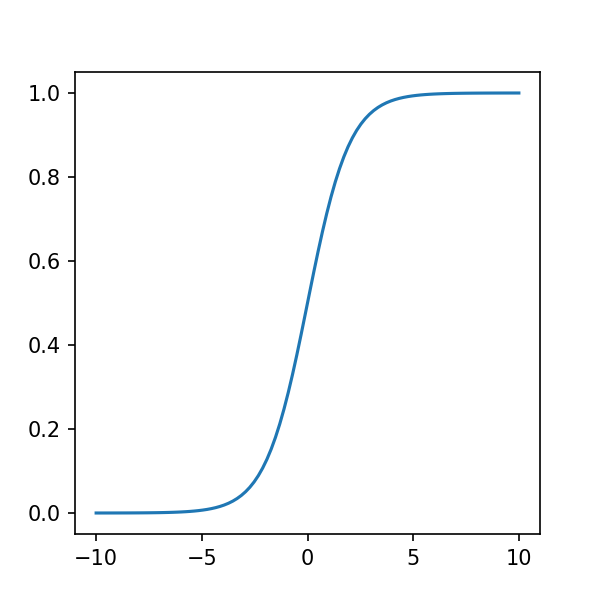

In [73]:
## Sigmoid
def sigm(x):
    return 1. / (1. + np.exp(-x))
x = np.linspace(-10.,10.,100)    
fig,ax = plt.subplots(1,1,figsize=(4,4))
ax.plot(x,sigm(np.array(x)))

# Logit transformation

This is a transformation applied to probabilities, so numbers with the range of 0 and 1. After this transformation we obtain odds which are not anymore bounded between 0 and 1.

$$logit(p) = log(\frac{p}{1-p}) $$

This is this transformed values that the logistic regression tries to model.

$$logit(p) = w^TX$$

which is equal to 

$$log(\frac{p}{1-p}) = w^TX$$

or without the matrix notation

$$log(\frac{p}{1-p}) = w_0 + w_1X$$

we can recover the odds by exponentiating

$$\frac{p}{1-p} = e^{w_0 + w_1X}$$

and the predicted probability $p$ would be equal to

$$ p = \frac{1}{1+e^{-(w_0 + w_1X)}} = \frac{e^{w_0 + w_1X}}{e^{w_0 + w_1X}+1}$$

which is exactly the sigmoid (logistic) function. Note how formulating everything in terms of logits make it easier to grasp the overall idea.

The more the term $wX$ at the exponent grows towards infinity the closer we approach the upper asymptote, and vice versa.

<IPython.core.display.Javascript object>


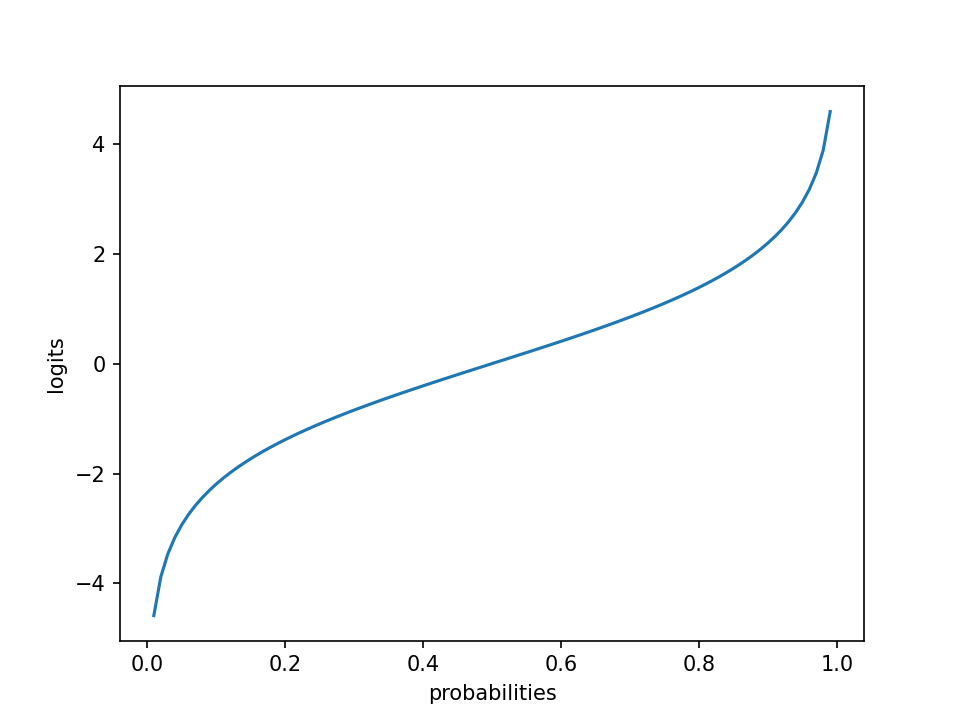

/Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in true_divide
  
/Users/sonat/Documents/repos/diary/.env/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in log
  


Text(0, 0.5, 'logits')

In [25]:
def logit_transform(p):
    return np.log(p/(1-p))

f,a = fa()
p = np.linspace(0,1,100)
a.plot(p,logit_transform(p))
a.set_xlabel('probabilities')
a.set_ylabel('logits')

# Nomenclature Clarification

- Logit Transformation transforms probabilities (bounded between [0,1]) to [-Inf, +Inf]. This is a vertically standing sigmoid if you will. 
- In tensorflow the output of this conversion is called logits (super confusing).
- Softargmax takes a bunch of logits and generates a new vector that sums to 1, thus it create a p.d out of these numbers.
- Squashing the range [-Inf,+Inf] to a bounded range is done with a Sigmoid function and it is the inverse operation of Logit Transform. 

# Logistic Regression

Logistic regression is a linear regression applied on logit transformed probabilities. 

$$ p(y | x, w)$$ which is $$ Bernouilli(y | sigmoid(w^Tx)) $$

For example one can model the probability of having at least one trafic accident in relation to average speed of driving. For each person, one could have a binary variable (accident or not) to be predicted by a continous number (speed).

The negative log-likelihood function on parameters runs through all data points

$$ L(w) = \sum_i^N{\log[ p_i^{y_{i}} \times (1-p_i)^{(1-y_{i})} ]} $$

In this equation above,
- predicted values are probabilities, $p_i$, and
- target values are $y_i$ which play the role of indicator variable. 

It is either class 1 or 0 which is the true class.

This can also be written in the following form without loss of generality:

$$ L(w) = \sum{y_i\log(p_i)} = y_i \log{p_i} + (1-y_i) \log{1-p_i} $$

This similarity of this loss function to Cross-Entropy is now clearer.





<IPython.core.display.Javascript object>


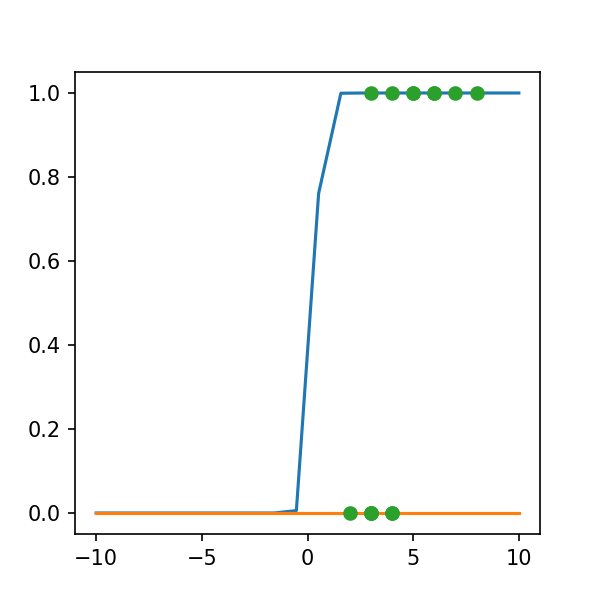

[[  0.   0.   0.  nan]
 [  0.   0.   0.  nan]
 [  0.   0.   0.  nan]
 [  0.   0.   0.  nan]
 [  0.   0.   0.  nan]
 [  0.   0.   0.  nan]
 [  1.   0.   0. -inf]
 [  1.   0.   0. -inf]
 [  1.   0.   0. -inf]
 [  1.   0.   0. -inf]
 [  1.   0.   0. -inf]
 [  1.   0.   0. -inf]
 [  1.   0.   0. -inf]
 [  1.   0.   0. -inf]]
loss:
-inf
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.

/Users/sonat/Documents/repos/ornament_symmgroups/.env/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: overflow encountered in exp
/Users/sonat/Documents/repos/ornament_symmgroups/.env/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: overflow encountered in exp
/Users/sonat/Documents/repos/ornament_symmgroups/.env/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: divide by zero encountered in log10
/Users/sonat/Documents/repos/ornament_symmgroups/.env/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in multiply


-125.22847819621617

In [68]:
#this is how you define machine epsilon with python
EPSILON = np.finfo(float).eps
#example
np.set_printoptions(suppress=True)
#data
x = np.array([3,4,3,2,4,3,5,4,6,7,8,6,5,3,]) # x values
y = np.array([0,0,0,0,0,0,1,1,1,1,1,1,1,1,]) # labels
#
w = np.array([-2500.,6])                     # the model parameters bad example
w2 = np.array([-2.,6])                     # the model parameters reasonable example
X = np.c_[np.ones(x.shape[0]),x]             # Design matrix
C = np.ones(20)                              # Constant
x_axis = np.linspace(-10,10,20)                # 
x_axis = np.c_[C,x_axis]

def logistic(x):
    return 1. / (1. + np.exp(-x))

def cross_entropy_robust(w,verbose=True):
    EPSILON    = np.finfo(float).eps
    y_hat      = logistic(X @ w)
    first_sum = (1-y) * np.log10(1-y_hat+EPSILON)
    second_sum  = y * np.log10(y_hat+EPSILON)
    loss       = np.sum(first_sum[y == 0]) + np.sum(second_sum[y == 1])
    if verbose:
        print(np.c_[y,y_hat,first_sum,second_sum])
        print('loss:')
        print(loss)
    return loss

def cross_entropy(w,verbose=True):
    y_hat = logistic(X @ w)
    first_sum   = (1-y) * np.log10(1-y_hat)
    second_sum  = y     * np.log10(y_hat)
    loss = np.sum(first_sum[y == 0]) + np.sum(second_sum[y == 1])
    if verbose:
        print(np.c_[ y , y_hat , first_sum , second_sum])
        print('loss:')
        print(loss)
    return loss

fig,ax = plt.subplots(1,1,figsize=(4,4))
ax.plot(x_axis[:,1],logistic(x_axis @ w2))
ax.plot(x_axis[:,1],logistic(x_axis @ w))
ax.plot(x,y,'o')
cross_entropy(w)
cross_entropy_robust(w)

The aim is to find the w vector that maximizes the cross_entropy.
if your starting values are totally off (try to put in w values that are super wrong), 
one might easily end up with problems:
- -Inf problem, because logistic function returns 0 and log(0) is -Inf. 
- And the Nan problem, which is actually caused by -Inf * 0, returning NaN.

In [69]:
#show the error surface
GS = 100 # grid size
L = np.zeros((GS,GS))
params = np.linspace(-50,50,GS)
for i,B0 in enumerate(params):
    for j,B1 in enumerate(params):
        w = np.array([B0,B1])
        print(w)
        L[i,j] =  cross_entropy_robust(w,verbose=True)
L        

[-50. -50.]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-50.         -48.98989899]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        

 [  1.           0.          -0.         -15.1773151 ]]
loss:
-83.17056168499654
[-48.98989899   5.55555556]
[[  0.           0.          -0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  1.           0.          -0.          -9.21230703]
 [  1.           0.          -0.         -11.62501365]
 [  1.           0.00000016  -0.          -6.79956014]
 [  1.           0.00004104  -0.          -4.38683077]
 [  1.           0.01050384  -0.          -1.97865172]
 [  1.           0.00000016  -0.          -6.79956014]
 [  1.           0.          -0.          -9.21230703]
 [  1.           0.          -0.         -14.02740659]]
loss:
-64.04163706465927
[-48.98989899   6.56565657]
[[  0.           0.          -0.          -0.        ]
 [  0.      

 [  1.           0.          -0.         -10.52834782]]
loss:
-27.152566239169094
[-46.96969697   8.58585859]
[[ 0.          0.         -0.         -0.        ]
 [ 0.          0.00000328 -0.00000143 -0.        ]
 [ 0.          0.         -0.         -0.        ]
 [ 0.          0.         -0.         -0.        ]
 [ 0.          0.00000328 -0.00000143 -0.        ]
 [ 0.          0.         -0.         -0.        ]
 [ 1.          0.01728629 -0.         -1.76229817]
 [ 1.          0.00000328 -0.         -5.48351761]
 [ 1.          0.98949616 -0.         -0.00458589]
 [ 1.          0.99999802 -0.         -0.00000086]
 [ 1.          1.         -0.         -0.        ]
 [ 1.          0.98949616 -0.         -0.00458589]
 [ 1.          0.01728629 -0.         -1.76229817]
 [ 1.          0.         -0.         -9.21230703]]
loss:
-18.229596469683717
[-46.96969697   9.5959596 ]
[[ 0.          0.00000001 -0.00000001 -0.        ]
 [ 0.          0.00018669 -0.00008109 -0.        ]
 [ 0.          0.00

[-44.94949495  -8.58585859]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-44.94949495  -7.57575758]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.     

 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[-43.93939394  47.97979798]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[-43.93939394  48.98989899]
[[  0.           1.         -15.65355977   0.        ]
 [  0.      

 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-40.90909091 -48.98989899]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-40.90909091 -47.97979798]
[[  0.           0.           0.          -0.        ]
 [  0.    

[-39.8989899  19.6969697]
[[  0.           1.          -8.33494459  -0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.          -8.33494459  -0.        ]
 [  0.           0.37635452  -0.20506222  -0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.          -8.33494459  -0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.          -0.        ]]
loss:
-56.51701553747266
[-39.8989899   20.70707071]
[[  0.           1.          -9.65098813  -0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.          -9.65098813

loss:
-125.22847819621617
[-37.87878788 -21.71717172]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-37.87878788 -20.70707071]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.     

 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-35.85858586 -39.8989899 ]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-35.85858586 -38.88888889]
[[  0.           0.           0.          -0.        ]
 [  0.    

[-34.84848485  22.72727273]
[[  0.           1.         -14.44943979  -0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -14.44943979  -0.        ]
 [  0.           0.99997524  -4.60616435  -0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -14.44943979  -0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.          -0.        ]]
loss:
-79.26160327597684
[-34.84848485  23.73737374]
[[  0.           1.         -15.35252978   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.352529

[-32.82828283   2.52525253]
[[  0.           0.          -0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  1.           0.          -0.          -8.77362584]
 [  1.           0.          -0.          -9.87032842]
 [  1.           0.00000002  -0.          -7.67692266]
 [  1.           0.00000026  -0.          -6.58021954]
 [  1.           0.00000328  -0.          -5.48351761]
 [  1.           0.00000002  -0.          -7.67692266]
 [  1.           0.          -0.          -8.77362584]
 [  1.           0.          -0.         -10.96702343]]
loss:
-65.80218601062056
[-32.82828283   3.53535354]
[[ 0.          0.         -0.         -0.        ]
 [ 0.          0.00000001 -0.         -0.        ]
 [ 0.          0.         -0.         -0.     

[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-30.80808081 -33.83838384]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.    

 [  1.           1.          -0.          -0.        ]]
loss:
-82.75863310840131
[-29.7979798   22.72727273]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           0.99999984  -6.79956014  -0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-85.06735901099627
[-29.7979798   23.73737374]
[[  0.           1.         -15.65355977   0.        ]
 [  0.      

 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-27.77777778 -21.71717172]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-27.77777778 -20.70707071]
[[  0.           0.           0.          -0.        ]
 [  0.    

-93.92135864716214
[-26.76767677  43.93939394]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[-26.76767677  44.94949495]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.

 [  1.           1.          -0.          -0.        ]]
loss:
-82.29422408579364
[-24.74747475  20.70707071]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           0.99999994  -7.23824139  -0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-85.50604026070694
[-24.74747475  21.71717172]
[[  0.           1.         -15.65355977   0.        ]
 [  0.      

 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-22.72727273 -35.85858586]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-22.72727273 -34.84848485]
[[  0.           0.           0.          -0.        ]
 [  0.    

 [  1.           1.          -0.           0.        ]]
loss:
-89.45415024678665
[-21.71717172  24.74747475]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -12.06361017  -0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-90.33140904583642
[-21.71717172  25.75757576]
[[  0.           1.         -15.65355977   0.        ]
 [  0.      

 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-19.6969697  -20.70707071]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-19.6969697 -19.6969697]
[[  0.           0.           0.          -0.        ]
 [  0.      

 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-17.67676768 -21.71717172]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-17.67676768 -20.70707071]
[[  0.           0.           0.          -0.        ]
 [  0.    

 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-15.65656566 -37.87878788]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[-15.65656566 -36.86868687]
[[  0.           0.           0.          -0.        ]
 [  0.    

 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[-14.64646465  42.92929293]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[-14.64646465  43.93939394]
[[  0.           1.         -15.65355977   0.        ]
 [  0.      

 [ 1.          0.00000072 -0.         -6.14153844]]
loss:
-53.519120740861254
[-12.62626263   0.50505051]
[[ 0.          0.00001495 -0.00000649 -0.        ]
 [ 0.          0.00002476 -0.00001076 -0.        ]
 [ 0.          0.00001495 -0.00000649 -0.        ]
 [ 0.          0.00000902 -0.00000392 -0.        ]
 [ 0.          0.00002476 -0.00001076 -0.        ]
 [ 0.          0.00001495 -0.00000649 -0.        ]
 [ 1.          0.00004104 -0.         -4.38683077]
 [ 1.          0.00002476 -0.         -4.60616435]
 [ 1.          0.000068   -0.         -4.16750183]
 [ 1.          0.00011267 -0.         -3.94818059]
 [ 1.          0.00018669 -0.         -3.72887209]
 [ 1.          0.000068   -0.         -4.16750183]
 [ 1.          0.00004104 -0.         -4.38683077]
 [ 1.          0.00001495 -0.         -4.82550073]]
loss:
-34.21742787633417
[-12.62626263   1.51515152]
[[ 0.          0.00030933 -0.00013436 -0.        ]
 [ 0.          0.00140592 -0.00061101 -0.        ]
 [ 0.          0.0003093

 [  1.           0.           0.         -15.63858824]]
loss:
-125.21350562574086
[-10.60606061  -8.58585859]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355976]
 [  1.           0.           0.         -15.65350089]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355976]
 [  1.           0.           0.         -15.41647837]]
loss:
-124.99133788940904
[-10.60606061  -7.57575758]
[[  0.           0.          -0.          -0.        ]
 [  0.    

[ -8.58585859 -36.86868687]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[ -8.58585859 -35.85858586]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.     

 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[-7.57575758 29.7979798 ]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[-7.57575758 30.80808081]
[[  0.           1.         -15.65355977   0.        ]
 [  0.          

 [  1.           0.           0.         -15.64804747]]
loss:
-125.22296584137607
[ -5.55555556 -10.60606061]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355693]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.55165638]]
loss:
-125.12657195640746
[-5.55555556 -9.5959596 ]
[[  0.           0.          -0.          -0.        ]
 [  0.      

-93.92135864716214
[-4.54545455 46.96969697]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[-4.54545455 47.97979798]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.    

 [  1.           1.          -0.           0.        ]]
loss:
-91.64489684298889
[-2.52525253 17.67676768]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -14.23858643  -0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-92.50638529919131
[-2.52525253 18.68686869]
[[  0.           1.         -15.65355977   0.        ]
 [  0.          

 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[ -0.50505051 -24.74747475]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[ -0.50505051 -23.73737374]
[[  0.           0.           0.          -0.        ]
 [  0.    

 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[  1.51515152 -47.97979798]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[  1.51515152 -46.96969697]
[[  0.           0.           0.          -0.        ]
 [  0.    

 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[ 2.52525253 42.92929293]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[ 2.52525253 43.93939394]
[[  0.           1.         -15.65355977   0.        ]
 [  0.          

loss:
-93.92135864716214
[ 4.54545455 23.73737374]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[ 4.54545455 24.74747475]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           

[ 6.56565657 -1.51515152]
[[ 0.          0.8829019  -0.93145014 -0.        ]
 [ 0.          0.62364548 -0.42440287 -0.        ]
 [ 0.          0.8829019  -0.93145014 -0.        ]
 [ 0.          0.97167712 -1.54786256 -0.        ]
 [ 0.          0.62364548 -0.42440287 -0.        ]
 [ 0.          0.8829019  -0.93145014 -0.        ]
 [ 1.          0.26696008 -0.         -0.57355367]
 [ 1.          0.62364548 -0.         -0.20506222]
 [ 1.          0.07410674 -0.         -1.13014231]
 [ 1.          0.01728629 -0.         -1.76229817]
 [ 1.          0.00385103 -0.         -2.41442283]
 [ 1.          0.07410674 -0.         -1.13014231]
 [ 1.          0.26696008 -0.         -0.57355367]
 [ 1.          0.8829019  -0.         -0.05408755]]
loss:
-13.034281442903822
[ 6.56565657 -0.50505051]
[[ 0.          0.99363468 -2.19617973 -0.        ]
 [ 0.          0.98949616 -1.97865172 -0.        ]
 [ 0.          0.99363468 -2.19617973 -0.        ]
 [ 0.          0.99614897 -2.41442283 -0.        ]
 [ 

 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[  8.58585859 -47.97979798]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[  8.58585859 -46.96969697]
[[  0.           0.           0.          -0.        ]
 [  0.    

 [  1.           1.          -0.           0.        ]]
loss:
-91.64489684298889
[ 9.5959596  11.61616162]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -14.23858643  -0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-92.50638529919131
[ 9.5959596  12.62626263]
[[  0.           1.         -15.65355977   0.        ]
 [  0.          

 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[ 11.61616162 -33.83838384]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[ 11.61616162 -32.82828283]
[[  0.           0.           0.          -0.        ]
 [  0.    

 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[12.62626263 44.94949495]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[12.62626263 45.95959596]
[[  0.           1.         -15.65355977   0.        ]
 [  0.          

 [  1.           1.          -0.           0.        ]]
loss:
-93.62032865149816
[14.64646465 11.61616162]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[14.64646465 12.62626263]
[[  0.           1.         -15.65355977   0.        ]
 [  0.          

[ 16.66666667 -21.71717172]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355806]]
loss:
-125.228476479728
[ 16.66666667 -20.70707071]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.       

loss:
-93.92135864716214
[17.67676768 47.97979798]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[17.67676768 48.98989899]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           

[19.6969697  9.5959596]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[19.6969697  10.60606061]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0

 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[ 21.71717172 -33.83838384]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[ 21.71717172 -32.82828283]
[[  0.           0.           0.          -0.        ]
 [  0.    

 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[22.72727273 35.85858586]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[22.72727273 36.86868687]
[[  0.           1.         -15.65355977   0.        ]
 [  0.          

[ 24.74747475 -18.68686869]
[[  0.           0.          -0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  0.           0.00000328  -0.00000143  -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.6535594 ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.          -0.         -13.59530565]]
loss:
-123.17022512522485
[ 24.74747475 -17.67676768]
[[  0.           0.          -0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.          -0.     

-93.92135864716214
[25.75757576 44.94949495]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[25.75757576 45.95959596]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.    

-91.07502153503232
[27.77777778  3.53535354]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.05149978  -0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.31929865583417
[27.77777778  4.54545455]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.    

[28.78787879 46.96969697]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[28.78787879 47.97979798]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977  

 [  1.           1.          -0.          -0.        ]]
loss:
-76.10770710954488
[30.80808081  0.50505051]
[[  0.           1.         -14.03031048  -0.        ]
 [  0.           1.         -14.23858643  -0.        ]
 [  0.           1.         -14.03031048  -0.        ]
 [  0.           1.         -13.81471068  -0.        ]
 [  0.           1.         -14.23858643  -0.        ]
 [  0.           1.         -14.03031048  -0.        ]
 [  1.           1.          -0.          -0.        ]
 [  1.           1.          -0.          -0.        ]
 [  1.           1.          -0.          -0.        ]
 [  1.           1.          -0.          -0.        ]
 [  1.           1.          -0.          -0.        ]
 [  1.           1.          -0.          -0.        ]
 [  1.           1.          -0.          -0.        ]
 [  1.           1.          -0.          -0.        ]]
loss:
-84.38281498928956
[30.80808081  1.51515152]
[[  0.           1.         -15.17643852  -0.        ]
 [  0.          

 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[32.82828283  3.53535354]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[32.82828283  4.54545455]
[[  0.           1.         -15.65355977   0.        ]
 [  0.          

 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[34.84848485  3.53535354]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[34.84848485  4.54545455]
[[  0.           1.         -15.65355977   0.        ]
 [  0.          

 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[36.86868687  7.57575758]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[36.86868687  8.58585859]
[[  0.           1.         -15.65355977   0.        ]
 [  0.          

 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[38.88888889  3.53535354]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[38.88888889  4.54545455]
[[  0.           1.         -15.65355977   0.        ]
 [  0.          

 [  1.           0.          -0.         -14.44851555]]
loss:
-124.02351506144001
[ 40.90909091 -23.73737374]
[[  0.           0.          -0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  0.           0.00140592  -0.00061101  -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.          -0.         -13.1590458 ]]
loss:
-122.73457522357589
[ 40.90909091 -22.72727273]
[[  0.           0.          -0.          -0.        ]
 [  0.    

 [  1.           0.           0.         -15.64804747]]
loss:
-125.2229673178956
[ 42.92929293 -26.76767677]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.00002476  -0.00001076  -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.55165638]]
loss:
-125.12658555625431
[ 42.92929293 -25.75757576]
[[  0.           0.          -0.          -0.        ]
 [  0.     

 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[ 44.94949495 -39.8989899 ]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.          -0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[ 44.94949495 -38.88888889]
[[  0.           0.           0.          -0.        ]
 [  0.    

 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[45.95959596 33.83838384]
[[  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  0.           1.         -15.65355977   0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]
 [  1.           1.          -0.           0.        ]]
loss:
-93.92135864716214
[45.95959596 34.84848485]
[[  0.           1.         -15.65355977   0.        ]
 [  0.          

 [  1.           0.9999999   -0.          -0.00000004]]
loss:
-82.40515610319898
[47.97979798 -9.5959596 ]
[[  0.           1.          -8.33494459  -0.        ]
 [  0.           0.999932    -4.16750183  -0.        ]
 [  0.           1.          -8.33494459  -0.        ]
 [  0.           1.         -12.50218992  -0.        ]
 [  0.           0.999932    -4.16750183  -0.        ]
 [  0.           1.          -8.33494459  -0.        ]
 [  1.           0.5         -0.          -0.30103   ]
 [  1.           0.999932    -0.          -0.00002953]
 [  1.           0.000068    -0.          -4.16750183]
 [  1.           0.          -0.          -8.33494458]
 [  1.           0.          -0.         -12.50211036]
 [  1.           0.000068    -0.          -4.16750183]
 [  1.           0.5         -0.          -0.30103   ]
 [  1.           1.          -0.          -0.        ]]
loss:
-75.61617549657726
[47.97979798 -8.58585859]
[[  0.           1.          -9.65098813  -0.        ]
 [  0.          

 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[ 50.         -48.98989899]
[[  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  0.           0.           0.          -0.        ]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]
 [  1.           0.           0.         -15.65355977]]
loss:
-125.22847819621617
[ 50.         -47.97979798]
[[  0.           0.           0.          -0.        ]
 [  0.    

array([[-125.2284782 , -125.2284782 , -125.2284782 , ...,  -93.92135865,
         -93.92135865,  -93.92135865],
       [-125.2284782 , -125.2284782 , -125.2284782 , ...,  -93.92135865,
         -93.92135865,  -93.92135865],
       [-125.2284782 , -125.2284782 , -125.2284782 , ...,  -93.92135865,
         -93.92135865,  -93.92135865],
       ...,
       [-125.2284782 , -125.2284782 , -125.2284782 , ...,  -93.92135865,
         -93.92135865,  -93.92135865],
       [-125.2284782 , -125.2284782 , -125.2284782 , ...,  -93.92135865,
         -93.92135865,  -93.92135865],
       [-125.2284782 , -125.2284782 , -125.2284782 , ...,  -93.92135865,
         -93.92135865,  -93.92135865]])

<IPython.core.display.Javascript object>


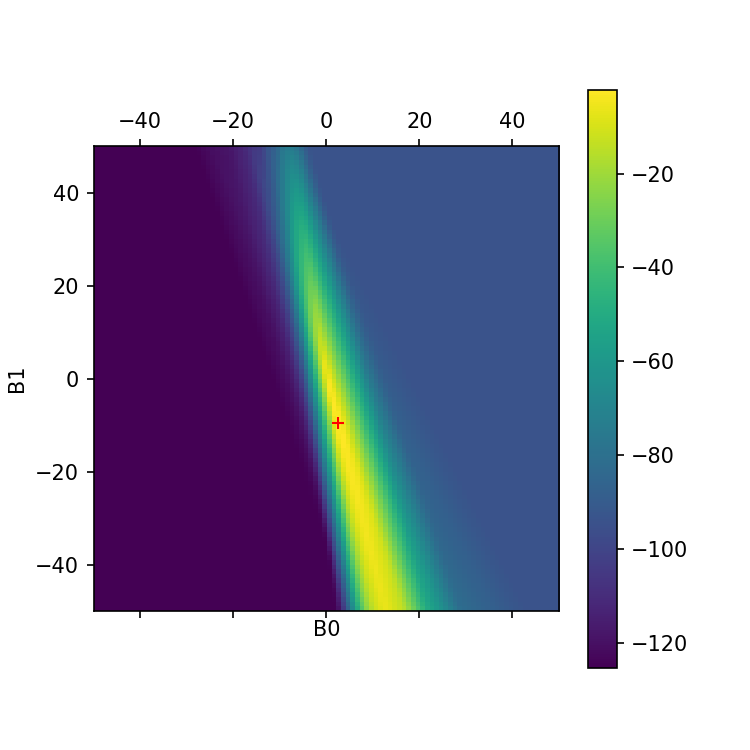

<IPython.core.display.Javascript object>


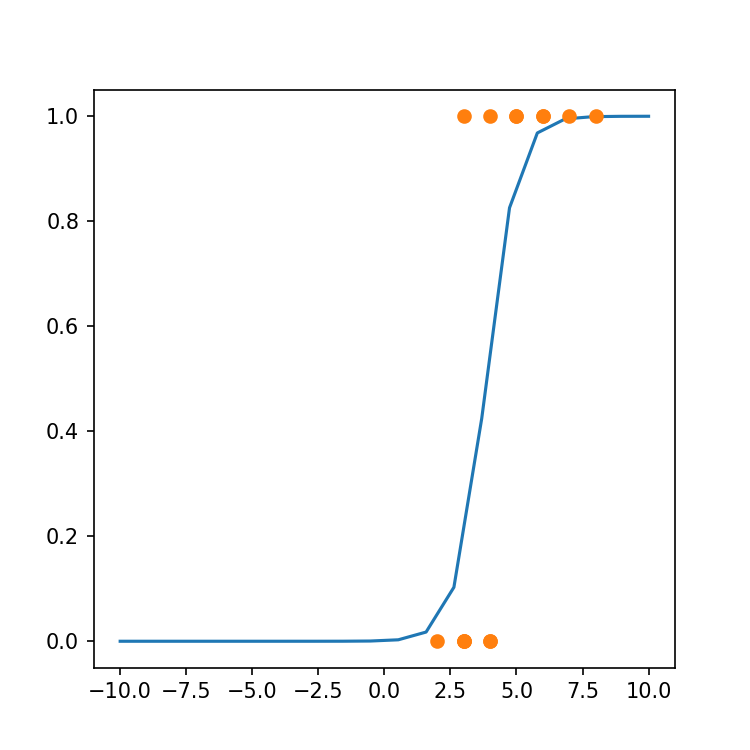

In [70]:
fig,ax = plt.subplots(1,1,figsize=(5,5))
img = ax.matshow(L,extent=[np.min(params),np.max(params),np.min(params),np.max(params)],origin='lower')
yi,xi = np.unravel_index(np.argmax(L),L.shape)
ax.plot(params[xi],params[yi],'r+')
ax.set_xlabel('B0')
ax.set_ylabel('B1')
plt.colorbar(img,ax=ax)

w = params[xi],params[yi]
fig, ax = plt.subplots(1,1,figsize=(5,5))
ax.plot(x_axis[:,1],logistic(x_axis @ [a,b]))
ax.plot(x,y,'o')


<IPython.core.display.Javascript object>


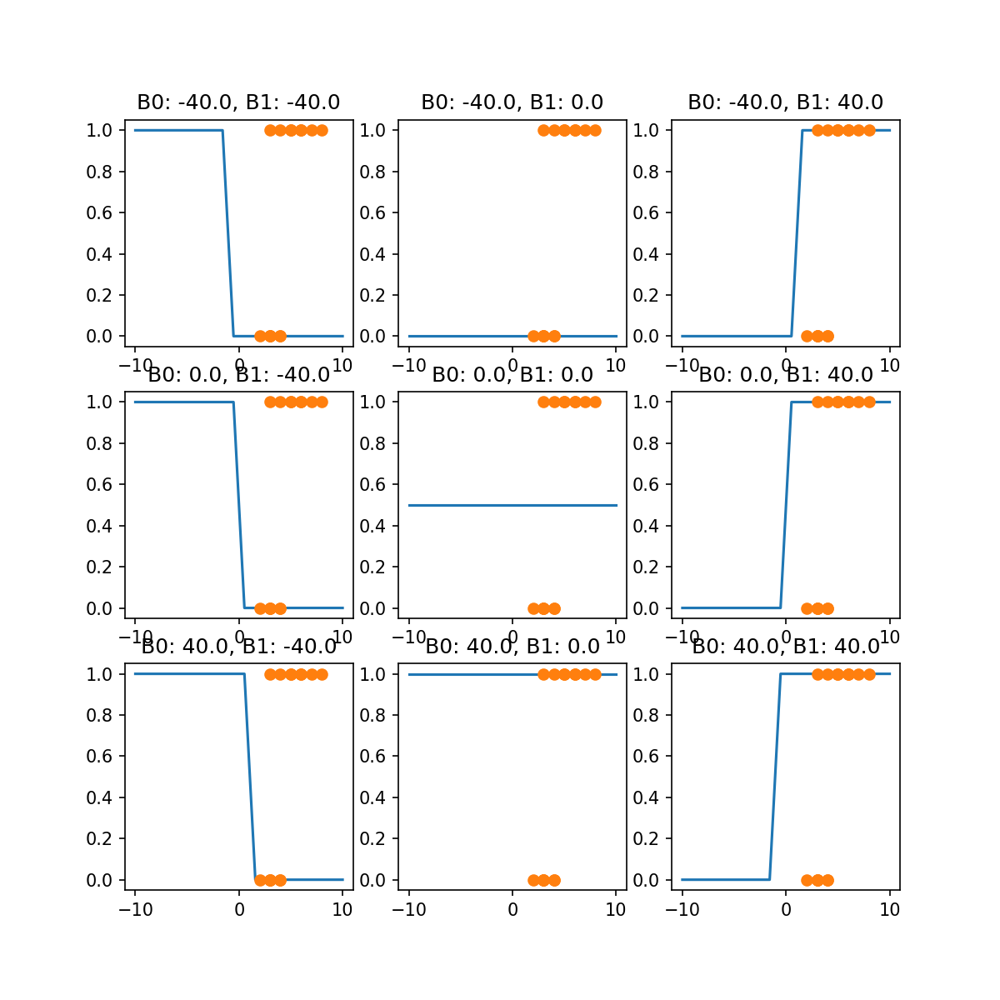

In [71]:
GS = 3 # grid size
fig,ax = plt.subplots(GS,GS,figsize=(8,8))
L = np.zeros((GS,GS))
params = np.linspace(-40,40,GS)
for i,B0 in enumerate(params):
    for j,B1 in enumerate(params):
        w = np.array([B0,B1])
        ax[i,j].plot(x_axis[:,1],logistic(x_axis @ w))
        ax[i,j].set_title(f"B0: {B0}, B1: {B1}")
        ax[i,j].plot(x,y,'o')


# 2D Sigmoid function

In [ ]:
def sigm2d(x,y):
    return 1. / (1. + np.exp(-x*0.2 + -y*0.41))
x = np.linspace(-2,2,10)
y = np.linspace(-2,2,10)
x,y = np.meshgrid(x,y)
z = sigm2d(x.reshape(-1),y.reshape(-1))
z = z.reshape(10,10)
plt.matshow(z)

# Log-Loss

